# Analysis of the food service in Moscow

## Presentation of the analysis

Presentation: https://drive.google.com/file/d/13W_vLSiF02f3YtWzu0yNM26osy0JwgGd/view?usp=sharing

**Description of the project**  
Preparation of a study of the food service in Moscow, search for interesting features and presentation of the results obtained, which in the future will help in choosing a suitable place for investors.  
A dataset with Moscow food service compiled on the basis of data from Yandex Maps and Yandex Business services for the summer of 2022. The information posted in the Yandex Business service could have been added by users or found in publicly available sources. It is purely for reference purposes.  

**Description of the data**  
File `moscow_places.csv`:
- `name` — the name of the establishments  
- `address` — the address of the establishments 
- `category` — the category of the establishments, for example, "cafe", "pizzeria" or "coffee shop"  
- `hours` — information about working days and hours  
- `lat` — latitude of the geographical point where the establishment is located  
- `lng` — the longitude of the geographical point where the establishment is located  
- `rating` — the rating of the place according to user ratings in Yandex Maps (the highest rating is 5.0)  
- `price` — the category of prices in the establishment, for example, "average", "below average", "above average" and so on  
- `avg_bill` - a string with the average cost of an order as a range, for example:  
-- "Average bill: 1000-1500 ₽";  
-- "The price of a cappuccino cup: 130-220 ₽";  
-- "The price of a glass of beer: 400-600 ₽".  
-- and so on;  
- `middle_avg_bill` - a number with an average bill, which is specified only for values from the avg_bill column starting with the substring "Average bill":  
-- If a price range of two values - the row concludes the median of these two values.  
-- If a price range is a single number — the row concludes this number.  
-- If there is no value or it does not start with "Average bill" - the row concludes nothing.  
- `middle_coffee_cup` - a number with the rating of one cup of cappuccino, which is specified only for values from the avg_bill column starting with the substring "The price of a cappuccino cup":  
-- If a price range of two values - the row concludes the median of these two values.  
-- If a price range is a single number — the row concludes this number.  
-- If there is no value or it does not start with "The price of a cappuccino cup" - the row concludes nothing.  
- `chain` - a number expressed as 0 or 1, which means is the establishment chain or independent:  
-- 0 — the establishment is independet  
-- 1 — the establishment is chain  
- `district` — the administrative district in which the establishment is located, for example, the Central Administrative District  
-`seats` — the number of seats.

## Downloading data and exploring general information

In [46]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import json

from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [47]:
# read file
data = pd.read_csv('/Users/a1/Downloads/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [48]:
# explore general information about dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


The dataset consists of 8406 rows. The columns `hours`, `price`, `avg_bill`, `medley_avg_bill`, `medley_coffee_cup` and `seats` have missing values. The `seats` column is assigned float data type, but the number of seats in the establishment cannot be decimal.  
The next step is to perform data preprocessing.

## Data preprocessing

Fill in the gaps in those columns in which it is possible. Namely, in columns with the object data type.

In [49]:
# filled in gaps in the hours, price, avg_bill columns
data['hours'] = data['hours'].fillna('unknown')
data['price'] = data['price'].fillna('unknown')
data['avg_bill'] = data['avg_bill'].fillna('unknown')

There are quite a large number of missing values in the columns `middle_avg_bill`, `medley_coffee_cup` and `seats`, so we cannot delete rows with omissions. But it is not possible to fill them with any values. Therefore, leave the omissions as they are.

Change the data type in the `seats` column

In [50]:
# change the data type in the `seats` column as int
data['seats'] = data['seats'].astype('Int64')

Check the dataframe for obvious duplicates

In [51]:
# check the dataframe for obvious duplicates
data.duplicated().sum()

0

Check the column with the category of the establishment for the implicit duplicates

In [52]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

There are no duplicates

Check if there are duplicates of the pair `name` and `address`

In [53]:
data.duplicated(subset=['name', 'address']).sum()

0

There are no implicit duplicates for the pair `name` and `address`

Create a `street` column with street names from the address column

In [54]:
# divide the string by comma to extract the second part with the street name
data['street'] = data['address'].str.split(',').str[1].str.strip()
data['street'].head()

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object

Create a column `is_24_7` indicating that the establishment is open daily and around the clock (24/7):
- the logical value is True — if the establishment is open daily and around the clock  
- the boolean value is False — in the opposite case

In [55]:
# creating a new column where we check for the words 'ежедневно, круглосуточно'
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

**Conclusion**  
As part of the data preprocessing, we filled in the gaps, changed the data type where necessary, checked for duplicates in the dataframe and added 2 new columns to the dataframe: `street` and `is_24_7`

## Data analysis

### Which categories of establishments are represented in the data?  
We explore the number of food service by category: restaurants, coffee shops, pizzerias, bars and so on. Let's build visualizations.

In [56]:
# grouping the data in the category column by quantity
category_data = data['category'].value_counts()
category_data = category_data.to_frame(name='counts')
category_data

,counts
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


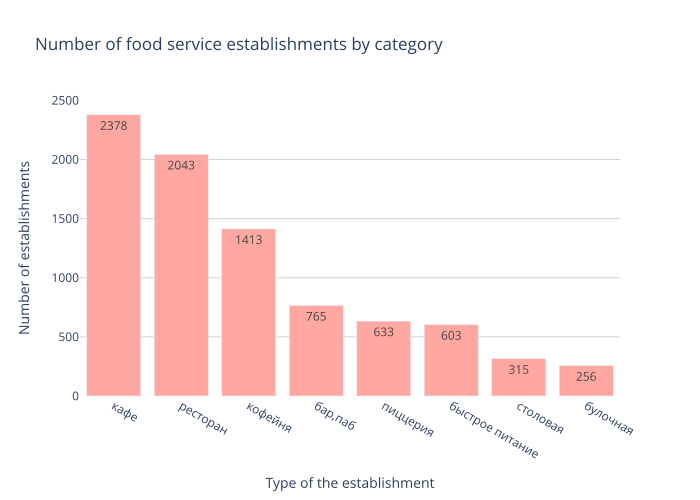

In [57]:
# build bar plot
fig = px.bar(category_data, y='counts', text='counts', 
             title='Number of food service establishments by category')
fig.update_xaxes(title_text='Type of the establishment') # подпись для оси X
fig.update_yaxes(title_text='Number of establishments') # подпись для оси Y
fig.update_traces(marker_color='#ffa8a1') #задаем цвет столбцов
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # делаем фон графика белым
fig.show("svg")

There are most cafes, restaurants and coffee shops in Moscow. The likely reason for their larger number is that these establishments offer the widest variety of dishes. Bars, pubs, pizzerias, fast food outlets, cafeterias, and bakeries are more specialized places, so it's reasonable to assume there are fewer of them compared to "classic" establishments.

### Analysis of the number of seats in establishments by category  
Build visualizations

In [58]:
# create a table with data on the median number of seats in each category of establishments
seats = data.query('seats != -1').groupby('category').agg({'seats' : 'median'})
seats = seats.sort_values(by='seats', ascending=False)
seats['seats'] = seats['seats'].astype('int')
seats

/var/folders/pg/c33rgynn5_ld2l_gm40yhd700000gn/T/ipykernel_79838/115242757.py:2: RuntimeWarning:

Engine has switched to 'python' because numexpr does not support extension array dtypes. Please set your engine to python manually.



,seats
category,
ресторан,86
"бар,паб",82
кофейня,80
столовая,75
быстрое питание,65
кафе,60
пиццерия,55
булочная,50


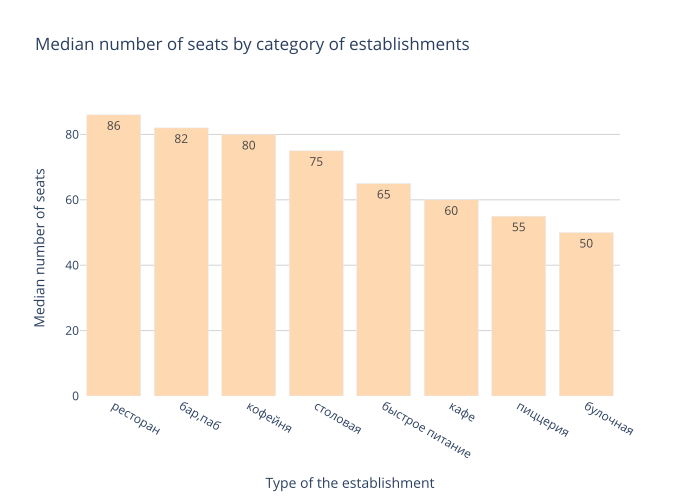

In [59]:
# build plot bar
fig = px.bar(seats, y='seats', text='seats', title='Median number of seats by category of establishments')
fig.update_xaxes(title_text='Type of the establishment') # подпись для оси X
fig.update_yaxes(title_text='Median number of seats') # подпись для оси Y
fig.update_traces(marker_color='#fed8b1') #задаем цвет столбцов
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # делаем фон графика белым
fig.show("svg") 

Restaurants (86 seats) are in 1st place in terms of the number of seats, bars and pubs (82 seats) are in 2nd place, coffee shops (80 seats) are in 3rd place, canteens (75 seats) are in 4th place. These types of establishments are not places for a quick snack, mostly people come there to relax and socialize. Therefore, it is logical that these institutions have the largest number of establishments.  
Other types of establishments are inferior in terms of the number of establishments, but in general, the difference in the number of establishments in different categories of establishments is not significant.

### Consider the ratio of сhain and independent establishments in the dataset

In [60]:
# build a table with data on the сhain and independent establishments 
chain_data = pd.DataFrame(data['chain'].value_counts().reset_index())
chain_data['chain'] = ['independent', 'chain']
chain_data

,chain,count
0,independent,5201
1,chain,3205


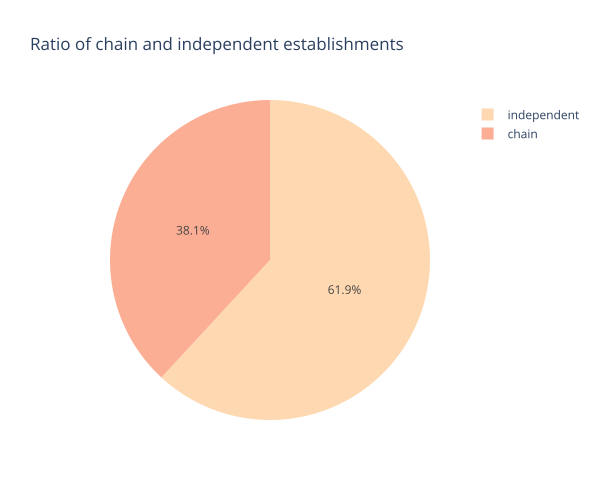

In [61]:
# build pie
fig = go.Figure(data=[go.Pie(labels=chain_data['chain'], values=chain_data['count'],
                            marker=dict(colors=['#fed8b1', '#fcae95']))])
fig.update_layout(title='Ratio of сhain and independent establishments', # title of graph
                  width=600, # size of graph
                  height=500)
fig.show("svg") 

There are mainly more independent places than chain ones: 61.9% and 38.1%

### Which categories of establishments are more often chain?  
Exploring the data

In [62]:
# create a table with data on chain establishments by category
chain_category = data.groupby('category').agg(
    total_count=('chain', 'size'),   # Total number of establishments
    chain_count=('chain', 'sum')     # Number of chain establishments
)
chain_category = pd.DataFrame(chain_category.reset_index())

# adding a column with the percentage of chain establishments
chain_category['chain_percent'] = ((chain_category['chain_count'] / chain_category['total_count']) * 100).round(2)

# sort the data in descending order of percentage
chain_category = chain_category.sort_values(by='chain_percent', ascending=False)
chain_category

,category,total_count,chain_count,chain_percent
1,булочная,256,157,61.33
5,пиццерия,633,330,52.13
4,кофейня,1413,720,50.96
2,быстрое питание,603,232,38.47
6,ресторан,2043,730,35.73
3,кафе,2378,779,32.76
7,столовая,315,88,27.94
0,"бар,паб",765,169,22.09


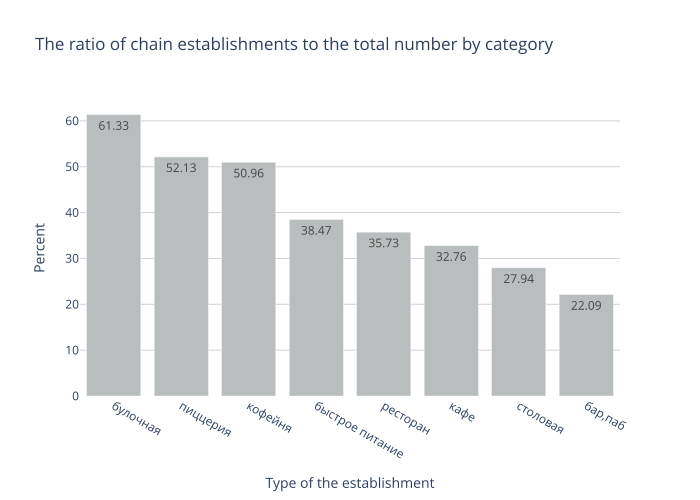

In [63]:
# build bar chart
fig = px.bar(chain_category, x='category', y='chain_percent', text='chain_percent', title='The ratio of chain establishments to the total number by category')
fig.update_xaxes(title_text='Type of the establishment') # title for the X-axis
fig.update_yaxes(title_text='Percent') # title for the Y-axis
fig.update_traces(marker_color='#b9bdbd') # setting the color of the columns
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # making the background of the graph white
fig.show("svg") 

Bakeries, pizzerias and coffee shops are most often chain establishments.  
Bars and pubs are the least common.

### Top 15 popular chain food service establishments in Moscow
Group the data by the names of establishments and find the top 15 popular chains in Moscow.

In [64]:
# find top 15 popular chain food service establishments in Moscow
chain_data = data.query('chain == 1') # select only chain establishments
chain_names = chain_data.groupby('name').agg({'address':'count'}) # grouping the data by name
chain_names = chain_names.rename(columns={'address':'count'}) # rename column
chain_names = chain_names.sort_values(by='count', ascending=False) # sort the chain_names data
chain_names = chain_names.reset_index()
chain_names_top_15 = chain_names.head(15)
chain_names_top_15 = chain_names_top_15['name'].tolist() # make a list with the names of the top 15 establishments

# filter the table and name the category of chain establishments
chain_top_15 = chain_data[chain_data['name'].isin(chain_names_top_15)]
chain_top_15 = chain_top_15.groupby(['name', 'category']).agg({'address':'count'}) # grouping the data by name
chain_top_15 = chain_top_15.rename(columns={'address':'count'}) # rename column
chain_top_15 = chain_top_15.sort_values(by='count', ascending=False) # sort data
chain_top_15 = chain_top_15.reset_index()
chain_top_15

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


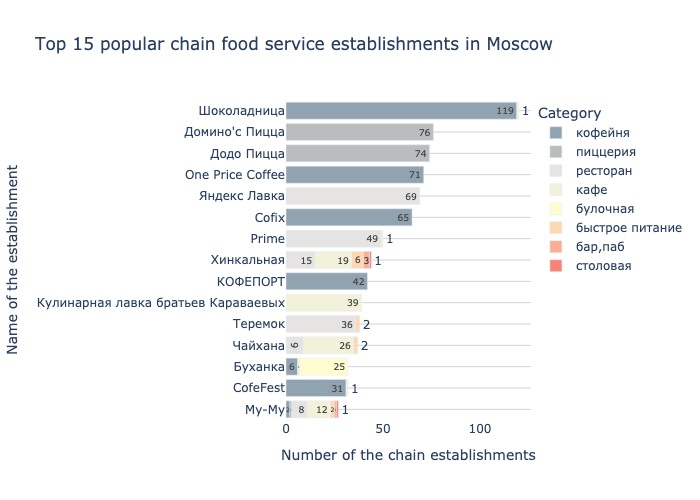

In [65]:
# setting the colors for the chart palette
colors = ["#91a3b0","#b9bdbd","#e5e4e2","#f2f1d9","#fffdd0","#fed8b1","#fcae95","#f88379"]

# build a bar chart
fig = px.bar(chain_top_15, x='count', y='name', text='count', color='category', 
             title='Top 15 popular chain food service establishments in Moscow',
             color_discrete_sequence=colors)
fig.update_xaxes(title_text='Number of the chain establishments') # title for the X-axis
fig.update_yaxes(title_text='Name of the establishment') # title for the Y-axis
fig.update_layout(
    plot_bgcolor='white', # making the background of the graph white 
    yaxis=dict(
        categoryorder='total ascending', # sort data
        showgrid=True,
        gridcolor='lightgray'), # add grid
    legend=dict(title="Category"))    
fig.show("png")

The first place in the top is occupied by a large margin by a "Chokoladnitsa" - 120 establishments. The 2nd and 3rd places belong to the pizzeria "Domino's Pizza" and "Dodo Pizza". Closes the top 15 "Mu-Mu" - 27 establishments. In general, all the establishments are very famous.  
Coffee shops are the most popular

### Consider the administrative districts of Moscow where the establishments are located. 
Display the number of establishments of each category by district.

In [66]:
# create a table with the number of establishments of each category by district
district_data = data.groupby(['district', 'category']).agg({'name':'count'}) # we group the data by districts and categories
district_data = district_data.rename(columns={'name':'count'}) # rename column
district_data = district_data.sort_values(by='count', ascending=False) # sort data
district_data = district_data.reset_index()
district_data.head(10)

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
5,Восточный административный округ,кафе,272
6,Северо-Восточный административный округ,кафе,269
7,Южный административный округ,кафе,264
8,Западный административный округ,кафе,239
9,Юго-Западный административный округ,кафе,238


Illustrate this information with one graph

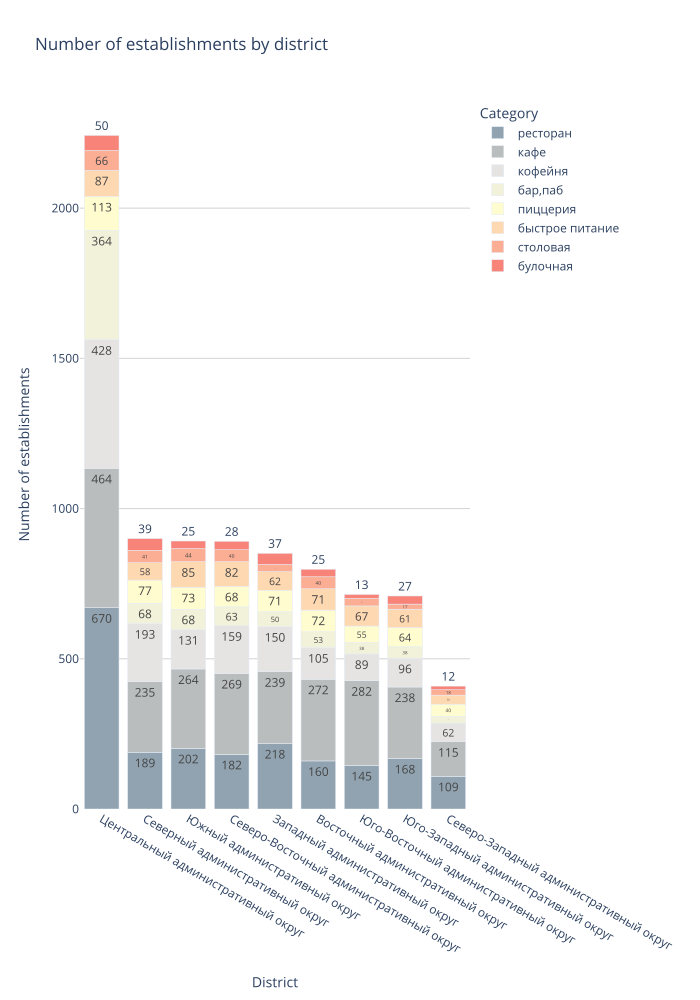

In [67]:
# set the colors for the chart palette
colors = ["#91a3b0","#b9bdbd","#e5e4e2","#f2f1d9","#fffdd0","#fed8b1","#fcae95","#f88379"]

# build bar chart
fig = px.bar(district_data, x='district', y='count', text='count', color='category', 
             title='Number of establishments by district',
             category_orders={'district':district_data['district']},
             color_discrete_sequence=colors)
fig.update_xaxes(title_text='District') # title for X-axis
fig.update_yaxes(title_text='Number of establishments') # title for Y-axis
fig.update_layout(height=1000, # set the height of the graph
                  plot_bgcolor='white', 
                  yaxis=dict(showgrid=True, gridcolor='lightgray'), # make the background of the graph white
                  xaxis=dict(categoryorder='total descending'), # sort the data by the total number of establishments
                  legend=dict(title="Category")) 
fig.show("svg")

There are 9 administrative districts in Moscow in total.  
According to the graph, it can be seen that the majority of all establishments in Moscow are located in the Central Administrative District (more than 2,000 establishments). The least number of establishments is located in the North-Western Administrative District (about 400 establishments).  
There are mostly more restaurants and cafes in all areas.

### Visualize the distribution of average ratings by category of establishments  
Do the average ratings differ greatly in different types of establishments?

In [68]:
# create a table with data on the average rating in each category of establishments
mean_rating = data.groupby('category').agg({'rating' : 'mean'}).round(2)
mean_rating = mean_rating.sort_values(by='rating', ascending=False)
mean_rating

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


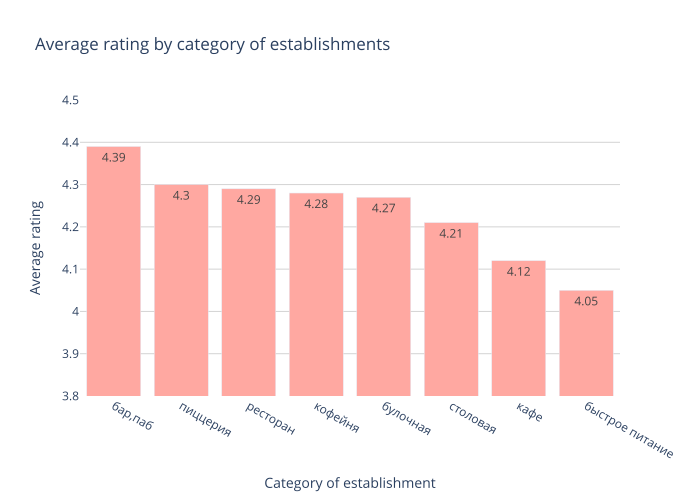

In [69]:
# build bar chart
fig = px.bar(mean_rating, y='rating', text='rating', title='Average rating by category of establishments')
fig.update_xaxes(title_text='Category of establishment') # title for X-axis
fig.update_yaxes(title_text='Average rating', range=[3.8, 4.5]) # title for Y-axis
fig.update_traces(marker_color='#ffa8a1') # set column's color
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # make the background of the graph white
fig.show("svg") 

The median rating of all categories of establishments is in the range of 4.05 - 4.39  
The difference is insignificant

### Let's build a choropleth with a median rating of establishments in each district

For each district, calculate the median rating of establishments that are located on its territory

In [70]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('median')
rating_district

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [71]:
# upload a JSON file with the boundaries of Moscow districts
state_geo = '/Users/a1/Downloads/admin_level_geomap.geojson'

# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# creating a choropleth using the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='The median rating of establishments by district',
).add_to(m)

# show map
m

Based on the choroplete, it can be seen that the  establishments of the Central Administrative District have the highest rating, which is logical, because there are more "presentable" establishments in the center of Moscow. In general, the median rating in different districts is practically the same.

### Display all the establishments of the dataset on the map

In [72]:
# creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# create an empty cluster, add it to the map
marker_cluster = MarkerCluster().add_to(m)

# write a function that accepts a dataframe string, create a marker at the current point and adds it to the marker_cluster cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# apply the create_clusters() function to each row of the dataframe
data.apply(create_clusters, axis=1)

# show map
m

According to the map with clusters, we clearly see that the largest number of establishments is located in the center of Moscow. There are fewer establishments in the southeastern district than in the opposite one - the northwestern one.

### Top 15 streets by number of establishments

In [73]:
# find top 15 streets by number of establishments
street_data = data.groupby('street').agg({'name':'count'}) # group data by street
street_data = street_data.rename(columns={'name':'count'}) # rename column
street_data = street_data.sort_values(by='count', ascending=False) # sort data
street_data = street_data.reset_index()
streets_top_15 = street_data.head(15)
streets_top_15 = streets_top_15['street'].tolist() # make a list with the names of the top 15 streets

# filter the table by the top 15 streets and specify their categories
street_data_top_15 = data[data['street'].isin(streets_top_15)]
street_data_top_15 = street_data_top_15.groupby(['street', 'category']).agg({'name':'count'}) # group data by street
street_data_top_15 = street_data_top_15.rename(columns={'name':'count'}) # rename column
street_data_top_15 = street_data_top_15.sort_values(by='count', ascending=False) # sort data
street_data_top_15 = street_data_top_15.reset_index()
street_data_top_15

,street,category,count
0,проспект Мира,кафе,53
1,МКАД,кафе,45
2,проспект Мира,ресторан,45
3,проспект Мира,кофейня,36
4,Профсоюзная улица,кафе,35
...,...,...,...
106,Люблинская улица,пиццерия,1
107,проспект Вернадского,булочная,1
108,Кутузовский проспект,булочная,1
109,МКАД,столовая,1


Plot the distribution of the number of establishments and their categories along these streets

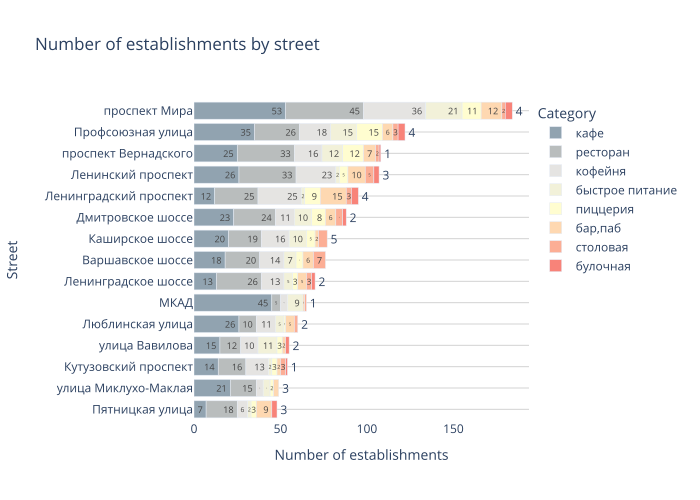

In [74]:
# set the colors for the chart palette
colors = ["#91a3b0","#b9bdbd","#e5e4e2","#f2f1d9","#fffdd0","#fed8b1","#fcae95","#f88379"]

# build bar chart
fig = px.bar(street_data_top_15, x='count', y='street', text='count', color='category', 
             title='Number of establishments by street',
             color_discrete_sequence=colors)
fig.update_xaxes(title_text='Number of establishments') # title for X-axis
fig.update_yaxes(title_text='Street') # title for Y-axis
fig.update_layout(
    plot_bgcolor='white', # make the background of the graph white 
    yaxis=dict(
        categoryorder='total ascending', # sort data
        showgrid=True,
        gridcolor='lightgray'), # add grid
    legend=dict(title="Category"))    
fig.show("svg")

The graph shows that most of the establishments are on "prospect Mira". These are mainly cafes and restaurants.  
The least number of establishments on Pyatnitskaya Street are mainly restaurants.  
In general cafes and restaurants predominate on all streets.

### Find the streets where there is only one establishment  
What can we said about these establishments?

In [75]:
filtered_data = street_data.query('count == 1') # select only those streets that meet 1 time
streets_unique = filtered_data['street'].tolist() # create a list with the names of these streets
display(filtered_data)

,street,count
990,улица Фотиевой,1
991,улица Фадеева,1
992,улица Кирпичные Выемки,1
993,сад Эрмитаж,1
994,улица Ивана Франко,1
...,...,...
1443,Павелецкая набережная,1
1444,Панкратьевский переулок,1
1445,Парусный проезд,1
1446,Певческий переулок,1


There are 458 streets in total, where only 1 establishment is located.  
Let's see basically which categories these establishments belong to

In [76]:
one_place_data_new = data[data['street'].isin(streets_unique)]
one_place_data_new = one_place_data_new['category'].value_counts().reset_index()
one_place_data_new.columns = ['category', 'count'] # rename column
one_place_data_new

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


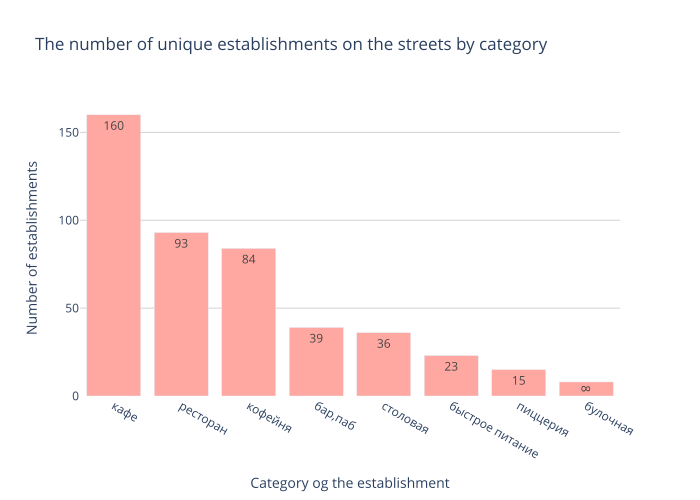

In [77]:
# build bar chart
fig = px.bar(one_place_data_new, x='category', y='count', text='count', title='The number of unique establishments on the streets by category')
fig.update_xaxes(title_text='Category og the establishment') # title for X-axis
fig.update_yaxes(title_text='Number of establishments') # title for Y-axis
fig.update_traces(marker_color='#ffa8a1') # set column's color
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # make the background of the graph white
fig.show("svg") 

Most often these are cafes, restaurants and coffee shops, and less often bakeries.

### Consider the median values of the average bills of establishments by district

Calculate the median of the `middle_avg_bill` column for each district

In [78]:
# calculate the median average bill by districts
median_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Build a choropleth with the obtained values for each district

In [79]:
# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Median average bill by district',
).add_to(m)

# show map
m

The Central and Western districts have the highest average bill - 1000 rubles.  
The lowest average bill in the Southeastern, Southern and Northeastern regions are about 500 rubles.  
Based on the choropleth, it is difficult to say whether the distance from the center affects the average bill, because both areas with a high average check and a low one are adjacent to the Central District.

### Conclusion

Data analysis revealed that Moscow has the highest number of cafes, restaurants, and coffee shops. This is likely due to the broad range of dishes available in these establishments. Bars, pubs, pizzerias, fast-food outlets, cafeterias, and bakeries are more specialized venues, so it's reasonable to assume there are fewer of them compared to “classic” establishments.

According to the analysis, independent establishments are more prevalent in Moscow than chain establishments, accounting for 61.9% and 38.1%, respectively. Bakeries, pizzerias, and coffee shops are most commonly chain establishments.

We also identified the top 15 popular establishments in Moscow. The top spot by a significant margin goes to the coffee shop chain Shokoladnitsa, with 119 locations. The second and third spots belong to the pizzerias Domino's Pizza and Dodo Pizza. Rounding out the top 15 is the coffee shop Coffeemania, with 22 locations. The top 15 establishments include:
- 6 coffee shops
- 3 restaurants
- 3 cafes
- 2 pizzerias
- 1 bakery

Moscow is divided into nine administrative districts. The vast majority of establishments are located in the Central Administrative District (over 2,000 establishments). The fewest are in the North-West Administrative District, with around 400. In all districts, restaurants and cafes predominate.

The median rating of all establishments in Moscow was also analyzed, with ratings across all categories ranging between 4.2 and 4.4, showing no significant difference. The highest ratings are found in the Central Administrative District.

An analysis was conducted on the number of establishments on each street. The most establishments are on Prospekt Mira, primarily cafes and restaurants. The fewest are on Dmitrovskoye Shosse, which has only restaurants. Overall, cafes and restaurants are the most common types of establishments across all streets.

Finally, the average check by district was analyzed. The Central and Western districts have the highest average bill, at around 1,000 rubles. The lowest average bill are in the South-Eastern, Southern, and North-Eastern districts, at approximately 500 rubles.

## Detailing the research: opening a coffee shop

### Find out how many coffee shops there are in the dataset

For further analysis, we will select only coffee shops from the dataset. 

In [80]:
# make a cut by selecting only coffee shops
coffee_data = data.query('category == "кофейня"').reset_index(drop=True)
coffee_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,<NA>,улица Маршала Федоренко,False
1,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,1,<NA>,парк Левобережный,False
2,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,unknown,unknown,NaN,NaN,1,46,Коровинское шоссе,False
3,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,unknown,unknown,NaN,NaN,1,<NA>,улица Маршала Федоренко,False
4,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,unknown,unknown,NaN,NaN,1,<NA>,улица Дыбенко,False


In [81]:
# see how many coffee shops there are in Moscow
len(coffee_data)

1413

There are 1,413 coffee shops in Moscow.   

Let's find out their location in the context of Moscow districts.

In [82]:
# group the data by district
coffeeshop_district = coffee_data.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)
coffeeshop_district = pd.DataFrame(coffeeshop_district.reset_index())
coffeeshop_district = coffeeshop_district.rename(columns={'index':'district', 'name':'count'})
coffeeshop_district

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [83]:
# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=coffeeshop_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='The number of coffee shops by Moscow districts',
).add_to(m)

# show map
m

Thus, the most coffee shops are located in the Central Administrative District of Moscow - 428  
The Northern Administrative District is in second place in terms of the number of coffee shops - 193  
The least coffee shops in the North-Western Administrative District - 62

## Find out if there are 24/7 coffee shops

Let's see how many 24/7 coffee shops there are in Moscow

In [84]:
# make a cut by selecting only 24-hour coffee shops
coffee_24_7 = coffee_data.query('is_24_7 == True').reset_index(drop=True)
len(coffee_24_7)

59

59 coffee shops in Moscow out of 1,413 are 24/7. This is about 4% of the total.

See which areas have more 24-hour coffee shops

In [85]:
# group the data by district
coffee_24_7 = coffee_24_7.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)
coffee_24_7 = pd.DataFrame(coffee_24_7.reset_index())
coffee_24_7 = coffee_24_7.rename(columns={'index':'district', 'name':'count'})
coffee_24_7

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [86]:
# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=coffee_24_7,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='The number of 24-hour coffee shops by Moscow districts',
).add_to(m)

# show map
m

According to the choropleth, it can be seen that there are most 24/7 coffee shops in the central administrative district (26 coffee shops). In all other districts of Moscow, there are fewer than 10 24/7 coffee shops.

### Look at the ratings of coffee shops

Calculate the average rating of coffee shops for each district

In [87]:
# group the data
coffee_rating_district = coffee_data.groupby('district', as_index=False)['rating'].agg('mean').round(1)
coffee_rating_district = coffee_rating_district.sort_values(by='rating', ascending=False)
coffee_rating_district

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
7,Юго-Западный административный округ,4.3
1,Западный административный округ,4.2
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2
8,Южный административный округ,4.2


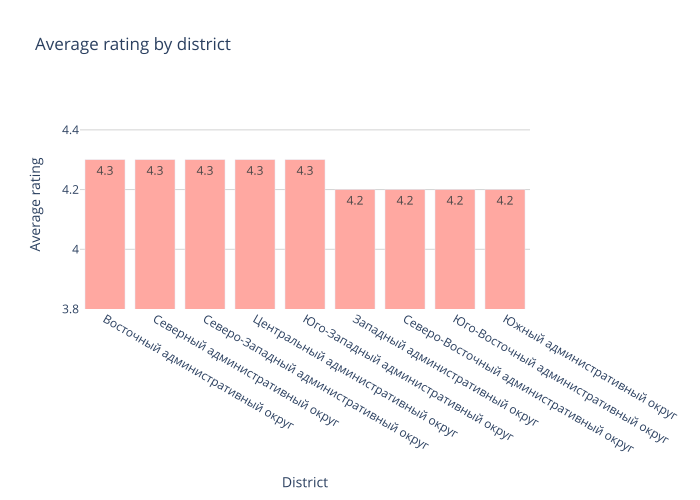

In [88]:
# build bar chart
fig = px.bar(coffee_rating_district, x='district', y='rating', text='rating', title='Average rating by district')
fig.update_xaxes(title_text='District') # title for X-axis
fig.update_yaxes(title_text='Average rating', range=[3.8, 4.5]) # title for Y-axis
fig.update_traces(marker_color='#ffa8a1') # set column's color
fig.update_layout(plot_bgcolor='white',
                  yaxis=dict(showgrid=True, gridcolor='lightgray')) # make the background of the graph white
fig.show("svg") 


The difference between the average ratings by district is not significant.

### What is the cost of a cup of cappuccino worth focusing on when opening a coffee shop

Calculate the median of the `middle_coffee_cup` column for each district

In [89]:
# calculate the median average cost of a cup of coffee by district by grouping
middle_coffee_cup = coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
middle_coffee_cup = middle_coffee_cup.sort_values(by='middle_coffee_cup', ascending=False)
middle_coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Build a choropleth with the obtained values for each district

In [90]:
# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='The median cost of a cup of coffee by district',
).add_to(m)

# show map
m

The most expensive cost of a cup of coffee in the Western, Southwestern and Central Administrative Districts. The cheapest is in the East.  
In general, the median cost of a cup of coffee varies from 135 to 198 rubles, depending on the area. Probably, to set the price of a cup of coffee, you first need to determine the area and see what the median cost of a cup of coffee is inherent in this area.

### Conclusion and recommendations for opening a coffee shop

When opening a new coffee shop, it is recommended to choose the Western or Southwestern districts. In these areas, the average price of a cup of coffee is higher than in other districts, so setting a similar price can help generate higher profits.  

The Central district has the highest coffee prices, but opening a coffee shop there is not recommended due to high competition, making it challenging to establish and sustain a presence.

In the Western and Southwestern districts, there are relatively few 24/7 coffee shops, so it might be worth considering a 24-hour operation. However, this decision should depend on the specific location of the coffee shop. If it's in a residential area, operating 24/7 may not be practical, as labor costs may not be covered. But if the coffee shop is planned for a busy street, a 24-hour schedule could be worth exploring.